In [127]:

# linear algebra
import numpy as np 

# data processing, CSV file I/O (e.g. pd.read_csv)
import pandas as pd 

# for visualistically representing the data
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

import datetime
from PIL import Image
import warnings
warnings.filterwarnings("ignore")

In [128]:
data = pd.read_csv("netflix_titles.csv")
print(data.shape)
data.head()

(8807, 12)


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


In [129]:
# To find unique content on each row
data.nunique()

show_id         8807
type               2
title           8807
director        4528
cast            7692
country          748
date_added      1767
release_year      74
rating            17
duration         220
listed_in        514
description     8775
dtype: int64

In [130]:
# Counting null values in each column
data.isnull().sum()

show_id            0
type               0
title              0
director        2634
cast             825
country          831
date_added        10
release_year       0
rating             4
duration           3
listed_in          0
description        0
dtype: int64

In [131]:
# expl above

# DATA CLEANING

In [132]:
data.director.fillna("No Director", inplace=True)
data.cast.fillna("No Cast", inplace=True)
data.country.fillna("Country Unavailable", inplace=True)
data.dropna(subset=["date_added", "rating"], inplace=True)
# dropped the rows with NaN values in "date_added","rating" columns because they are very few.

In [133]:
data.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        3
listed_in       0
description     0
dtype: int64

# DATA VISUALIZATION

# 1. Types of content on Netflix

In [134]:
Visualization = px.pie(values=data['type'].value_counts(), 
             names=data['type'].value_counts().index,title='Types of Content on Netflix')

Visualization.show()

In [135]:
# provide understanding

# 2) Displaying the content type based on the selected Country


In [136]:
# Certain films and television shows have many country names. 
# We only took into account the first country name that appeared in the country column.

In [137]:
data['country'] = [countries[0] for countries in data['country'].str.split(',')]

In [138]:
def visualise_country(country):
    if (country == ALL):
        data_vis = data
    
    else:
        data_vis = data[data.country == country]
        
    Visualization = px.pie(values=data_vis['type'].value_counts(), 
             names=data_vis['type'].value_counts().index, 
             title=f'Total number of TV-Shows and Movies from {country}.')
    Visualization.show()

In [139]:
# The "ipywidgets" library was used to pick the country we wanted to view using a dropdown menu. 
# The function visualise_country represents the number of TV shows and movies available in the selected country.

In [140]:
import ipywidgets as widgets
from ipywidgets.widgets.interaction import show_inline_matplotlib_plots

ALL = 'ALL'
def total_unique_country_names(array):
    unique = array.unique().tolist()
    unique.sort()
    unique.insert(0, ALL)
    return unique

dropdown_country = widgets.Dropdown(options = total_unique_country_names(data.country))
output_country = widgets.Output()

def dropdown_country_eventhandler(change):
    output_country.clear_output()
    with output_country:
        display(visualise_country(change.new))
        
dropdown_country.observe(dropdown_country_eventhandler, names='value')
display(dropdown_country)

Dropdown(options=('ALL', '', 'Argentina', 'Australia', 'Austria', 'Bangladesh', 'Belarus', 'Belgium', 'Brazil'…

In [141]:
display(output_country)

Output()

# 3) Top 15 Countries producing the content to Netflix

In [142]:
data_country = data['country'].value_counts().sort_values(ascending=False)
top15countries = data_country.head(15)
top15countries

United States          3205
India                  1008
Country Unavailable     829
United Kingdom          627
Canada                  271
Japan                   257
France                  212
South Korea             211
Spain                   181
Mexico                  134
Australia               115
Egypt                   112
Turkey                  111
Germany                 103
China                   100
Name: country, dtype: int64

In [143]:
Visualization = px.pie(values=top15countries, 
                       names=top15countries.index,title='Top 15 Countries producing the content to Netflix')

Visualization.show()

# 4) Ratings classification on Netflix

In [144]:
Ratings = data['rating'].value_counts()
Ratings

TV-MA       3205
TV-14       2157
TV-PG        861
R            799
PG-13        490
TV-Y7        333
TV-Y         306
PG           287
TV-G         220
NR            79
G             41
TV-Y7-FV       6
NC-17          3
UR             3
74 min         1
84 min         1
66 min         1
Name: rating, dtype: int64

In [145]:
Visualization = px.funnel(Ratings,title='Types of Rating on Netflix')

Visualization.show()

In [146]:
def group_by_rating(rating):
    if rating in ['TV-Y', 'TV-Y7', 'TV-Y7-FV', 'G', 'TV-G', 'PG', 'TV-PG']:
        new_rating = 'Kids'
    elif rating in ['PG-13', 'TV-14']:
        new_rating = 'Teens'
    elif rating in ['R', 'NC-17', 'TV-MA']:
        new_rating = 'Adults'
    else:
        new_rating = 'Unrated'
    return new_rating
        

data['rating_group'] = data.apply(lambda x: group_by_rating(x['rating']), axis=1)

print(data.rating_group.value_counts())

order_rating = ['Kids', 'Teens', 'Adults', 'Unrated']

Visualization = px.bar(y = data['rating_group'].value_counts(), 
             x = data['rating_group'].value_counts().index,
             labels = dict(x="Rating", y="Total Number"),
             title = 'TV-Shows and Movies Rating in Netflix'
            )

Visualization.update_xaxes(categoryorder = 'array', categoryarray= order_rating)

Visualization.show()

Adults     4007
Teens      2647
Kids       2054
Unrated      85
Name: rating_group, dtype: int64


In [147]:
# Movies Dataframe
netflix_movies=data[data['type']=='Movie']

In [148]:
# TV Shows Dataframe
netflix_shows=data[data['type']=='TV Show']

# 5) Ideal month to release movies

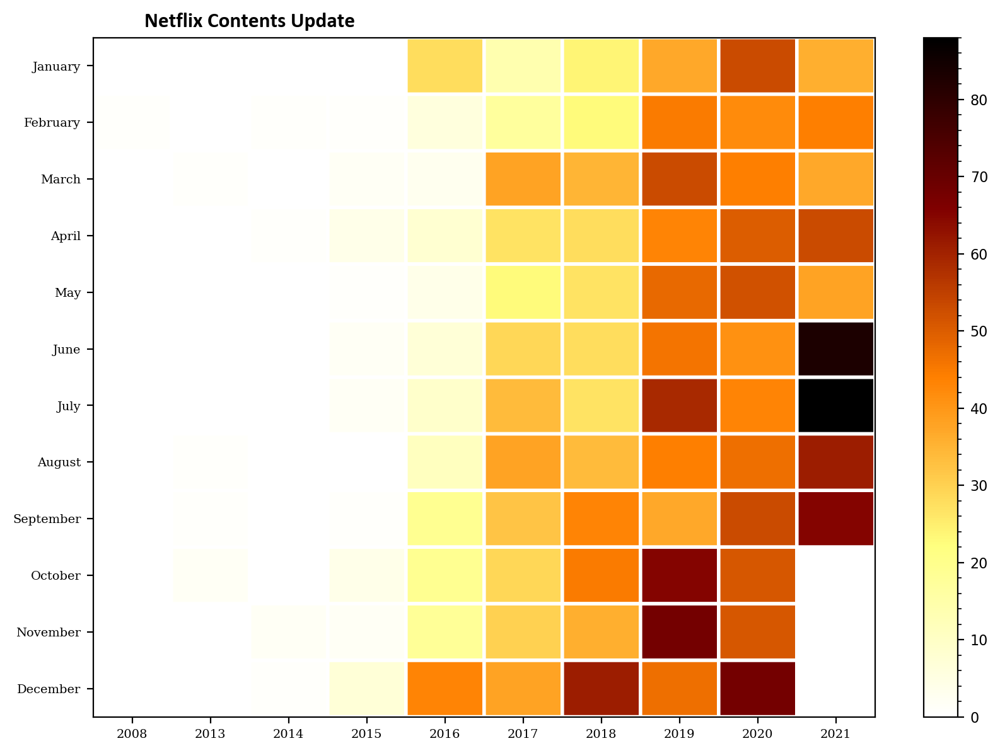

In [149]:

netflix_date = netflix_shows[['date_added']].dropna()
netflix_date['year'] = netflix_date['date_added'].apply(lambda x : x.split(', ')[-1])
netflix_date['month'] = netflix_date['date_added'].apply(lambda x : x.lstrip().split(' ')[0])

month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'][::-1]
df = netflix_date.groupby('year')['month'].value_counts().unstack().fillna(0)[month_order].T
plt.figure(figsize=(10, 7), dpi=200)
plt.pcolor(df, cmap='afmhot_r', edgecolors='white', linewidths=2) # heatmap
plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, fontsize=7, fontfamily='serif')
plt.yticks(np.arange(0.5, len(df.index), 1), df.index, fontsize=7, fontfamily='serif')

plt.title('Netflix Contents Update', fontsize=12, fontfamily='calibri', fontweight='bold', position=(0.20, 1.0+0.02))
cbar = plt.colorbar()

cbar.ax.tick_params(labelsize=8) 
cbar.ax.minorticks_on()
plt.show()

# 6) Occurances of each country

In [150]:
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go

In [151]:
# Visualization using Choropleth

df = data['country'].value_counts()

iplot([go.Choropleth(
    locationmode='country names',
    locations=df.index.values,
    text=df.index,
    z=df.values,
)])

# GENRES ANALISYS

In [152]:
def get_secondary_genre(text):
    if len(text.split(","))>1:
        secondary= text.split(",")[1].strip()
    else:
        secondary = text.split(",")[0].strip()
    return secondary
    
df = data;
df['main_genre']= df['listed_in'].apply(lambda x: x.split(",")[0])
df['secondary_genre']= df['listed_in'].apply(lambda x: get_secondary_genre(x))

In [153]:
#Assigning geners to generic ones.
mapping_genres_ ={'Documentaries':'Documentaries',
     'British TV Shows': 'International',
     'International TV Shows':'International', 
     'Crime TV Shows':'Crime',
    'Docuseries':'Documentaries', 
     'TV Dramas':'Dramas', 
     'Children & Family Movies':'Children & Family Movies', 
     'Dramas':'Dramas',
     'Comedies':'Comedies', 
     'TV Comedies':'Comedies', 
     'Thrillers':'Thrillers',
     'TV Thrillers':'Thrillers',
     'Horror Movies':'Horror', 
     "Kids' TV":"Kids' TV", 
     'Action & Adventure':'Action & Adventure', 
     'Reality TV':'Reality TV',
     'Anime Series':'Anime', 
     'International Movies':'International', 
     'Sci-Fi & Fantasy':'Sci-Fi & Fantasy',
       'Classic Movies':'Classic', 
     'TV Shows':'TV Shows', 
     'Stand-Up Comedy':'Stand-Up Comedy & Talk Shows',
       'TV Action & Adventure':'Action & Adventure', 
     'Movies':'Movies', 
     'Korean TV Shows':'International',
     'Stand-Up Comedy & Talk Shows':'Stand-Up Comedy & Talk Shows',
       'Classic & Cult TV':'Classic', 
     'Anime Features':'Anime', 
       'Cult Movies':'Cult', 
     'Classic Movies':'Classic',
     'Independent Movies':'Independent Movies', 
     'TV Horror':'Horror',
        'Music & Musicals':'Music & Musicals', 
       'LGBTQ Movies':'LGBTQ', 
     'Sports Movies':'Sport',
          'Spanish-Language TV Shows':'International',
         'Romantic TV Shows':'Romantic',
         'Romantic Movies':'Romantic',
         'TV Action & Adventure':'Action & Adventure',
         'TV Sci-Fi & Fantasy': 'Sci-Fi & Fantasy',
      'International TV Shows':'International',
     'Faith & Spirituality':'Faith & Spirituality',
      'Science & Nature TV':'Science & Nature'
                     }

In [154]:
df['main_genre']=df['main_genre'].map(mapping_genres)
df['secondary_genre']=df['secondary_genre'].map(mapping_genres)

In [155]:
df.loc[df['main_genre']=='LGBTQ']
df.loc[df['main_genre'] == 'LGBTQ', ['main_genre']] = df[df['main_genre'] == 'LGBTQ']['secondary_genre']
df.loc[df['main_genre'] == 'Cult', ['main_genre']] = df[df['main_genre'] == 'Cult']['secondary_genre']
df.loc[df['main_genre'] == 'Sport', ['main_genre']] = df[df['main_genre'] == 'Sport']['secondary_genre']
df.loc[df['main_genre'] == 'Independent Movies', ['main_genre']] = df[df['main_genre'] == 'Independent Movies']['secondary_genre']

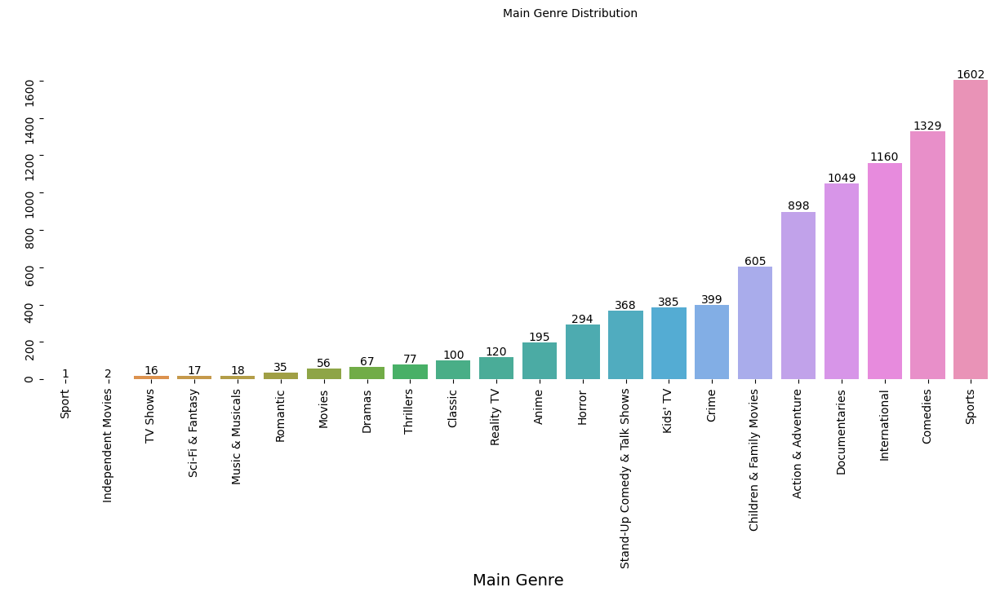

In [156]:
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
sns.countplot(data = df, x = 'main_genre',ax=ax, order = df['main_genre'].value_counts(ascending=True).index)
ax.set_xlabel(xlabel='Main Genre', size=14)
ax.set_ylabel(ylabel=" ")
ax.bar_label(ax.containers[0])
sns.despine(bottom=True, left=True)
ax.tick_params(labelrotation=90)
fig.text(0.5, 1,"Main Genre Distribution")
plt.show()

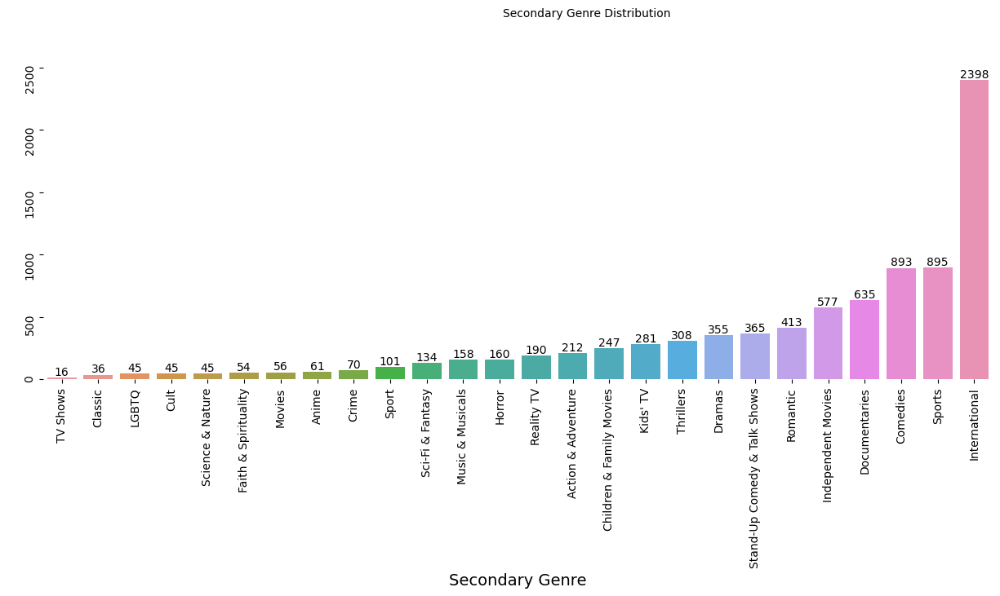

In [157]:
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
sns.countplot(data = df, x = 'secondary_genre',ax=ax, order = df['secondary_genre'].value_counts(ascending=True).index)
ax.set_xlabel(xlabel='Secondary Genre', size=14)
ax.set_ylabel(ylabel=" ")
ax.bar_label(ax.containers[0])
sns.despine(bottom=True, left=True)
ax.tick_params(labelrotation=90)
fig.text(0.5, 1,"Secondary Genre Distribution")
plt.show()

In [158]:
import nltk

#nltk.download('punkt')
from nltk.corpus import stopwords


stops = set(stopwords.words("english"))
def text_preprocessing(columns_pandas,stop_words):
    tokens = nltk.word_tokenize(columns_pandas)
    tokens = [w for w in tokens if w.isalpha()]  
    tokens = [word for word in tokens if not word in stop_words]
    preprocessed_text = " ".join(tokens)
    return preprocessed_text
df['Preprocessed_Description'] = df.apply(lambda x: text_preprocessing(x['description'],stops), axis=1)

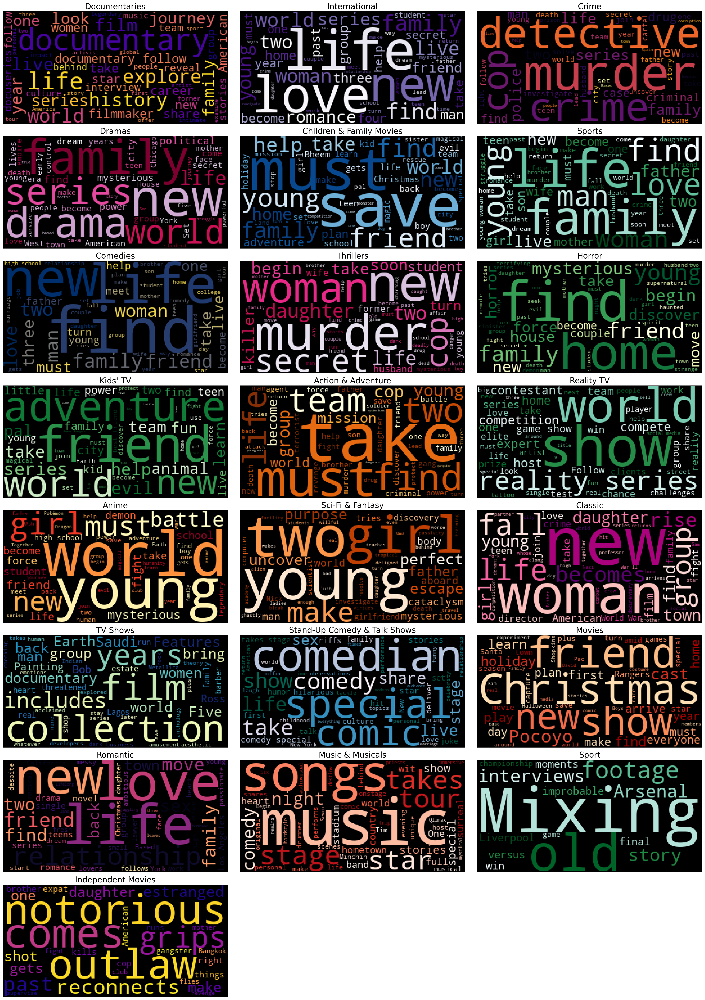

In [159]:
from wordcloud import WordCloud

colormaps = ['plasma', 'Purples', 'inferno', 'PuRd', 'Blues', 'BuGn', 'cividis', 'PuRd', 'YlGn', 'Greens',
             'YlOrBr', 'BuGn', 'YlOrRd', 'Oranges', 'RdPu', 'YlGnBu', 'PuBuGn', 'OrRd', 'magma', 'Reds', 'BuGn']

plt.figure(figsize=(25, 35), dpi=160)
for i, value in enumerate(df['main_genre'].unique()):
    plt.subplot(8, 3, i+1)
    plt.title(value, fontsize=20)
    colormap = colormaps[i % len(colormaps)]
    plt.imshow(WordCloud(colormap=colormap, max_words=50).generate(text=' '.join(df[df['main_genre'] == value]['Preprocessed_Description'])))
    plt.axis('off')
    
plt.tight_layout()
plt.show()


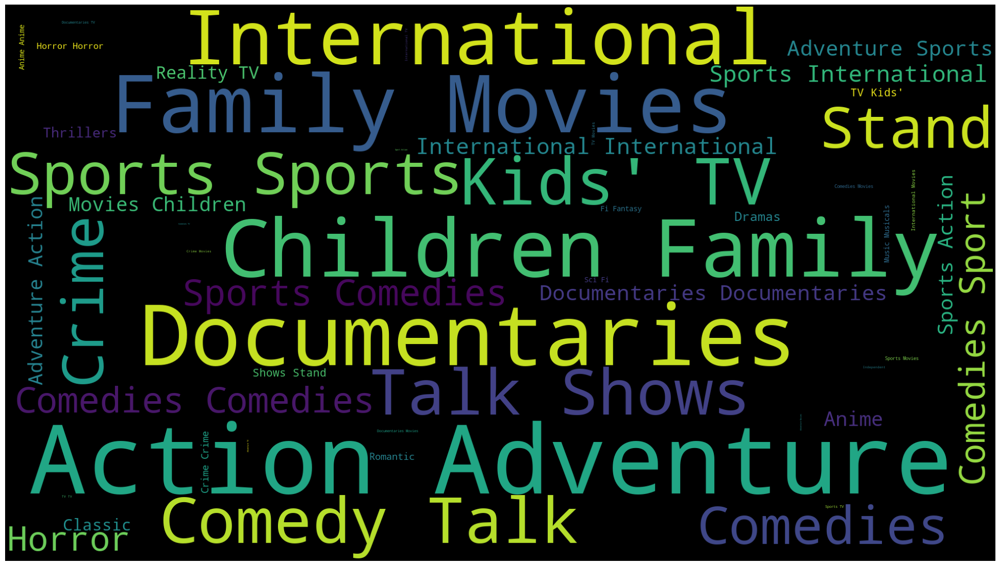

In [160]:
plt.subplots(figsize=(25,15))
wordcloud = WordCloud(
                          background_color='Black',
                          width=1920,
                          height=1080
                         ).generate(" ".join(df.main_genre))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('cast.png')
plt.show()

In [48]:
#What type of show Netflix produces the most ?
df.type

0         Movie
1       TV Show
2       TV Show
3       TV Show
4       TV Show
         ...   
8802      Movie
8803    TV Show
8804      Movie
8805      Movie
8806      Movie
Name: type, Length: 8793, dtype: object

In [49]:
df.type.value_counts()

Movie      6129
TV Show    2664
Name: type, dtype: int64

In [50]:
#Which country produces the most number of content on Netflix ?
# Extract country column from the datatset.
df.country

0             United States
1              South Africa
2       Country Unavailable
3       Country Unavailable
4                     India
               ...         
8802          United States
8803    Country Unavailable
8804          United States
8805          United States
8806                  India
Name: country, Length: 8793, dtype: object

In [51]:
# Count of the top 10 records of the country column.
df.country.value_counts().head(10)

United States          3205
India                  1008
Country Unavailable     829
United Kingdom          627
Canada                  271
Japan                   257
France                  212
South Korea             211
Spain                   181
Mexico                  134
Name: country, dtype: int64

In [52]:
# Names of the top 10 countries who produces most number of the content on Netflix.
df['country'].value_counts().index[0:10]

Index(['United States', 'India', 'Country Unavailable', 'United Kingdom',
       'Canada', 'Japan', 'France', 'South Korea', 'Spain', 'Mexico'],
      dtype='object')

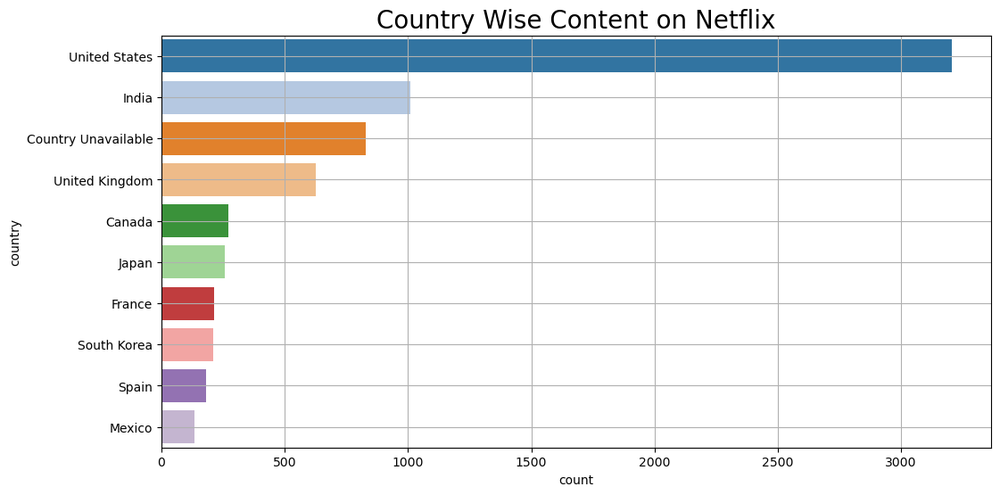

In [75]:
# Countplot of top 10 countries who produces most number of content on the Netflix.
plt.figure(figsize=(12,6))
sns.countplot(y='country',order=df['country'].value_counts().index[0:10],data=df,lw=2)
plt.title('Country Wise Content on Netflix',fontsize=20)
plt.grid(True)
plt.show()

In [54]:
#Which category of content Netflix produces the most ?

In [55]:
# Name and count of the top 5 most category content on the Netflix.
df['listed_in'].value_counts().head()

Dramas, International Movies                        362
Documentaries                                       359
Stand-Up Comedy                                     334
Comedies, Dramas, International Movies              274
Dramas, Independent Movies, International Movies    252
Name: listed_in, dtype: int64

In [56]:
# Names of the top 5 most category content on the Netflix.
x=list(df['listed_in'].value_counts().head().keys())
x

['Dramas, International Movies',
 'Documentaries',
 'Stand-Up Comedy',
 'Comedies, Dramas, International Movies',
 'Dramas, Independent Movies, International Movies']

In [57]:
# Count of the top 5 most category content on the Netflix.
y=list(df['listed_in'].value_counts().head())
y

[362, 359, 334, 274, 252]

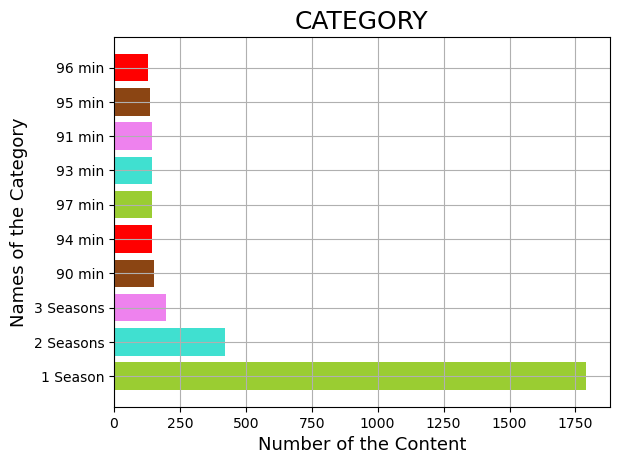

In [78]:
    # Bar-plot for top 5 most category content on the Netflix.
    mycolors = ["#9ACD32", "#40E0D0", "#EE82EE", "#8B4513",'#FF0000']
    plt.barh(x,y,color=mycolors,lw=2)
    plt.title("CATEGORY",fontsize=18)
    plt.xlabel("Number of the Content",fontsize=13)
    plt.ylabel('Names of the Category',fontsize=13)
    plt.grid(True)
    plt.show()

In [ ]:
content_count_by_year = df['Release Year'].value_counts().sort_index()
plt.plot(content_count_by_year.index, content_count_by_year.values)
plt.title("Content Count by Release Year")
plt.xlabel("Release Year")
plt.ylabel("Number of Content")
plt.xticks(rotation=45)
plt.show()

In [59]:
#Who direct most of the contents on theNetflix ?

In [60]:
df['director'].value_counts().head()

No Director               2621
Rajiv Chilaka               19
Raúl Campos, Jan Suter      18
Suhas Kadav                 16
Marcus Raboy                16
Name: director, dtype: int64

In [61]:
df['cast'].value_counts().head()  

No Cast                                                                                    825
David Attenborough                                                                          19
Vatsal Dubey, Julie Tejwani, Rupa Bhimani, Jigna Bhardwaj, Rajesh Kava, Mousam, Swapnil     14
Samuel West                                                                                 10
Jeff Dunham                                                                                  7
Name: cast, dtype: int64

In [70]:
# Name of the top 10 durations of the dataset. 
x=list(df['duration'].value_counts().head(10).keys())
x

['1 Season',
 '2 Seasons',
 '3 Seasons',
 '90 min',
 '94 min',
 '97 min',
 '93 min',
 '91 min',
 '95 min',
 '96 min']

In [71]:
# Count of the top 10 duration of the dataset.
y=list(df['duration'].value_counts().head(10))
y

[1791, 421, 198, 152, 146, 146, 146, 144, 137, 130]

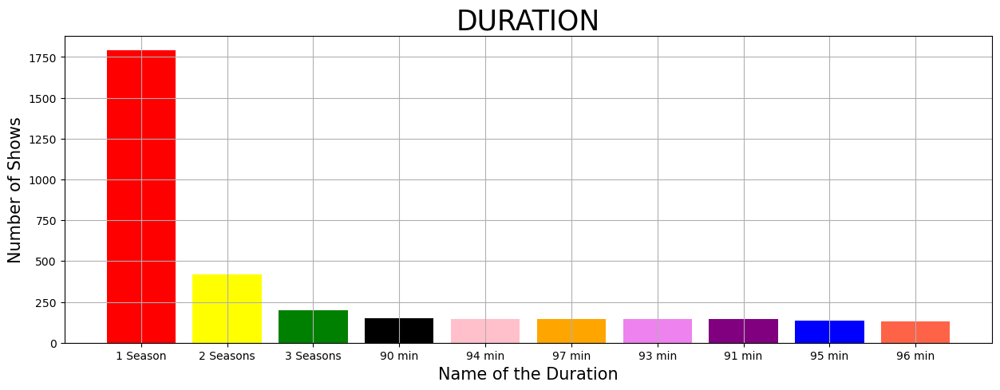

In [79]:
# Bar-plot of top 10 durations of the dataset.
plt.figure(figsize=(15,5))
plt.bar(x,y,color=['red','yellow','green','black','pink','orange','violet','purple','blue','#FF6347'],lw=2)
plt.grid(True)
plt.title("DURATION",fontsize=25)
plt.xlabel('Name of the Duration',fontsize=15)
plt.ylabel('Number of Shows',fontsize=15)
plt.show()

In [73]:
# Names of the top 10 countries who produces most amount of content on the Netflix.
df['country'].value_counts().index[0:10]

Index(['United States', 'India', 'Country Unavailable', 'United Kingdom',
       'Canada', 'Japan', 'France', 'South Korea', 'Spain', 'Mexico'],
      dtype='object')

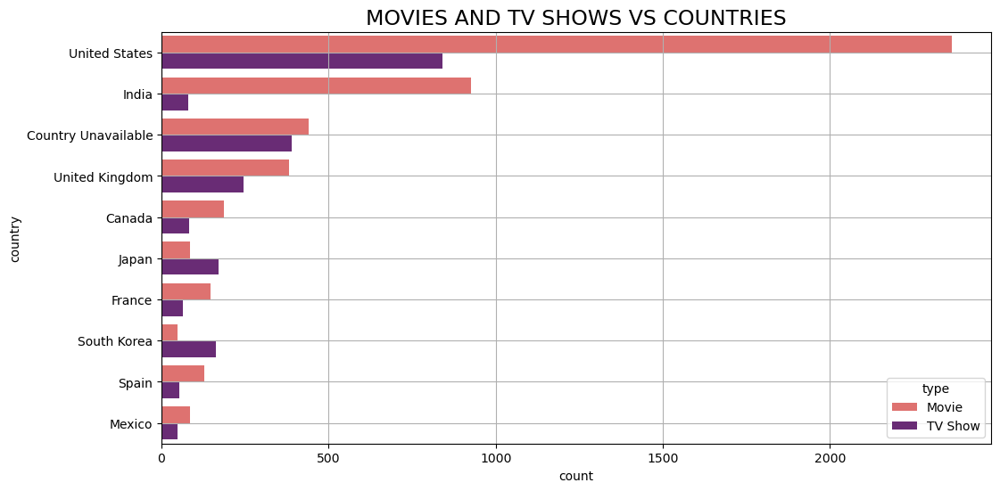

In [80]:
# Countplot about top 10 countries who produces most number of content on Netflix.
fig = plt.figure(figsize=(12,6))
sns.countplot(data = df,y = 'country', order = df["country"].value_counts().index[:10],hue = 'type',palette = 'magma_r',lw=2)
plt.title("MOVIES AND TV SHOWS VS COUNTRIES",fontsize=17)
plt.grid(True)
plt.show()

In [82]:
%matplotlib inline

try:
    import datetime
    import seaborn as sns
    import matplotlib.pyplot as plt
    import pandas as pd
    import geopandas as gpd
    import numpy as np
    import folium
    import geopy
    from folium.plugins import MarkerCluster
    from pycountry_convert import country_name_to_country_alpha3, country_name_to_country_alpha2
    from geopy.geocoders import Nominatim
except ModuleNotFoundError:
    !pip install folium
    !pip install geopy
    !pip install pycountry_convert

     -------------------------------------- 102.3/102.3 kB 2.0 MB/s eta 0:00:00
     -------------------------------------- 119.8/119.8 kB 1.4 MB/s eta 0:00:00
     ---------------------------------------- 40.3/40.3 kB 1.9 MB/s eta 0:00:00
     ---------------------------------------- 10.1/10.1 MB 3.3 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
     -------------------------------------- 203.6/203.6 kB 4.1 MB/s eta 0:00:00
  Created wheel for pycountry: filename=pycountry-22.3.5-py2.py3-none-any.whl size=10681896 sha256=07ac74c1f160dfbf5d1ae7b65907e8fe380bb365198cde3dd479d31a75faba77
  Stored in directory: c:\users\pavan\appdata\local\pip\cache\wheels\47\15\92\e6dc85fcb0686c82e1edbcfdf80c

In [84]:
import folium
import geopy
from folium.plugins import MarkerCluster
from pycountry_convert import country_name_to_country_alpha3, country_name_to_country_alpha2
from geopy.geocoders import Nominatim

In [85]:
netflix = df;
netflix = netflix.drop(['show_id','description'],axis=1)
netflix.date_added = pd.to_datetime(netflix.date_added)
netflix['month'] = netflix.date_added.dt.month
netflix['duration'] = netflix.duration.apply(lambda x : str(x).split("min")[0])
netflix['category'] = netflix.listed_in.apply(lambda x : x.split(",")[0])
netflix

,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,rating_group,main_genre,secondary_genre,Preprocessed_Description,month,category
0,Movie,Dick Johnson Is Dead,Kirsten Johnson,No Cast,United States,2021-09-25,2020,PG-13,90,Documentaries,Teens,Documentaries,Documentaries,As father nears end life filmmaker Kirsten Joh...,9,Documentaries
1,TV Show,Blood & Water,No Director,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries",Adults,International,Dramas,After crossing paths party Cape Town teen sets...,9,International TV Shows
2,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",Country Unavailable,2021-09-24,2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",Adults,Crime,International,To protect family powerful drug lord skilled t...,9,Crime TV Shows
3,TV Show,Jailbirds New Orleans,No Director,No Cast,Country Unavailable,2021-09-24,2021,TV-MA,1 Season,"Docuseries, Reality TV",Adults,Documentaries,Reality TV,Feuds flirtations toilet talk go among incarce...,9,Docuseries
4,TV Show,Kota Factory,No Director,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",Adults,International,Romantic,In city coaching centers known train India fin...,9,International TV Shows
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8802,Movie,Zodiac,David Fincher,"Mark Ruffalo, Jake Gyllenhaal, Robert Downey J...",United States,2019-11-20,2007,R,158,"Cult Movies, Dramas, Thrillers",Adults,Cult,Dramas,A political cartoonist crime reporter pair cop...,11,Cult Movies
8803,TV Show,Zombie Dumb,No Director,No Cast,Country Unavailable,2019-07-01,2018,TV-Y7,2 Seasons,"Kids' TV, Korean TV Shows, TV Comedies",Kids,Kids' TV,International,While living alone spooky town young girl befr...,7,Kids' TV
8804,Movie,Zombieland,Ruben Fleischer,"Jesse Eisenberg, Woody Harrelson, Emma Stone, ...",United States,2019-11-01,2009,R,88,"Comedies, Horror Movies",Adults,Comedies,Horror,Looking survive world taken zombies dorky coll...,11,Comedies
8805,Movie,Zoom,Peter Hewitt,"Tim Allen, Courteney Cox, Chevy Chase, Kate Ma...",United States,2020-01-11,2006,PG,88,"Children & Family Movies, Comedies",Kids,Children & Family Movies,Comedies,Dragged civilian life former superhero must tr...,1,Children & Family Movies


In [86]:
def get_continent(col):
    try:
        cn_a3_code =  country_name_to_country_alpha3(col)
        cn_a2_code = country_name_to_country_alpha2(col)
    except:
        cn_a3_code = np.nan
        cn_a2_code = np.nan
        
    return (cn_a2_code, cn_a3_code)

geolocator = Nominatim(user_agent="https")

def geolocate(country):
    if country == np.nan:
        return np.nan
    else:
        try:
            loc = geolocator.geocode(country)
            return loc.latitude, loc.longitude
        except:
            return np.nan

In [88]:

netflix['alpha_2'] = netflix.country.apply(lambda x: get_continent(x)[0])
netflix['alpha_3'] = netflix.country.apply(lambda x: get_continent(x)[-1])
country_coord = {}

for country in netflix.alpha_2.unique().tolist():
    location = geolocate(country)
    if isinstance(location, tuple) and len(location) == 2:
        latitude, longitude = location
        country_coord[country] = [latitude, longitude]
    else:
        # Handle the case when geolocation is not available for a country
        country_coord[country] = [None, None]

        
#for country in netflix.alpha_2.unique().tolist():
#    latitude, longitude = geolocate(country)
 #   country_coord[country] = [latitude, longitude]

for country in netflix.alpha_2.unique().tolist():
    netflix.loc[netflix['alpha_2'] == country, ['latitude','longitude']] = country_coord.get(country)[0],country_coord.get(country)[1]

In [89]:
world_map= folium.Map(tiles="cartodbpositron")
marker_cluster = MarkerCluster().add_to(world_map)
for i in range(len(netflix)):
    lat = netflix.iloc[i]['latitude']
    long = netflix.iloc[i]['longitude']
    if not np.isnan(lat):
        nation = netflix.iloc[i]['alpha_2']
        radius=5
        popup_text = """Country : {}<br>
                    Number of movies : {}<br>
                    Number of tv shows : {}<br>"""
        popup_text = popup_text.format(netflix.iloc[i]['country'],
                     netflix[['type','alpha_2']].groupby(['alpha_2','type']).size().unstack().loc[nation]['Movie'],
                     netflix[['type','alpha_2']].groupby(['alpha_2','type']).size().unstack().loc[nation]['TV Show'])
        folium.CircleMarker(location = [lat, long], radius=radius, popup= popup_text, fill =True).add_to(marker_cluster)

world_map

In [90]:
df = df.drop_duplicates(keep = 'first').reset_index(drop = True)

In [91]:
df.loc[df['rating'].str.split(' ').str.get(1) == 'min', 'duration'] = df[df['rating'].str.split(' ').str.get(1) == 'min']['rating']
df[df['duration'].isna()]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,rating_group,main_genre,secondary_genre,Preprocessed_Description


In [92]:
df.loc[df['rating'].str.split(' ').str.get(1) == 'min', 'rating'] = None

In [94]:
df['date_added'] = df['date_added'].astype('datetime64')
mean_val = df['date_added'].mean()
df['date_added'].fillna(value = mean_val, inplace = True)

In [95]:
df['rating'].fillna(df['rating'].mode()[0], inplace = True)